# Dog Breed Classification Using Convolutional Neural Networks

In [1]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.gridspec as gridspec
import numpy as np
import math
import shutil

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, datasets, transforms
from torch.utils.data import DataLoader, random_split
from torchvision.models import inception_v3
import torch.nn.functional as F

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [3]:
if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print("Using device:", device)

Using device: cuda


## Google Colab

In [4]:
!nvidia-smi

Sat Dec  6 04:26:01 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   71C    P8             14W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [5]:
import kagglehub
import os

# Download dataset
path = kagglehub.dataset_download("jessicali9530/stanford-dogs-dataset")
images_dir = os.path.join(path, "images", "Images")

# Set this as your source directory
src_dir = images_dir

Using Colab cache for faster access to the 'stanford-dogs-dataset' dataset.


## Data Pre-processing

In [6]:
# run only if dataset has been downloaded locally

# original dataset path
# src_dir = 'StanfordDogsDataset/Images/images/'

In [7]:
# new dataset path
dst_dir = 'data/'

# create destination folder if it doesn't exist
os.makedirs(dst_dir, exist_ok=True)

# get all dog breed categories
categories = os.listdir(src_dir)

for category in categories:
    # remove the numeric prefix and convert to lowercase
    cleaned_name = category.split('-', 1)[-1].lower()

    # create a folder for the dog breed
    breed_dst_path = os.path.join(dst_dir, cleaned_name)
    os.makedirs(breed_dst_path, exist_ok=True)

    # copy all images from the original folder to the cleaned folder
    category_src_path = os.path.join(src_dir, category)
    for file_name in os.listdir(category_src_path):
        src_file = os.path.join(category_src_path, file_name)
        dst_file = os.path.join(breed_dst_path, file_name)
        shutil.copy(src_file, dst_file)

120


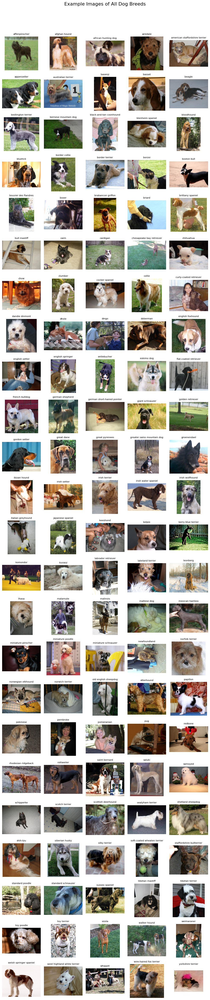

In [8]:
data_dir = 'data/'

# get all breeds
breeds = os.listdir(data_dir)
breeds.sort()  # optional: sort alphabetically
print(len(breeds))

# figure layout
num_breeds = len(breeds)
cols = 5  # number of columns per row
rows = math.ceil(num_breeds / cols)

fig = plt.figure(figsize=(cols * 2, rows * 2))
gs = gridspec.GridSpec(rows, cols)

# plot one image per breed
for idx, breed in enumerate(breeds):
    row = idx // cols
    col = idx % cols
    breed_path = os.path.join(data_dir, breed)
    image_list = os.listdir(breed_path)

    image = Image.open(os.path.join(breed_path, image_list[0])).convert('RGB')

    ax = fig.add_subplot(gs[row, col])
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(breed.replace('_', ' '), fontsize=8)

plt.suptitle('Example Images of All Dog Breeds', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [9]:
def create_dataloaders(data_dir, image_size, batch_size=32, test_split=0.2):

    # Training transforms
    train_transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.RandomResizedCrop(image_size, scale=(0.8, 1.0)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(10),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
    ])

    # Test transforms (no augmentation)
    test_transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])
    ])

    # Full dataset
    full_dataset = datasets.ImageFolder(root=data_dir, transform=train_transform)

    # Split into train/test
    total_size = len(full_dataset)
    test_size = int(test_split * total_size)
    train_size = total_size - test_size

    train_dataset, test_dataset = random_split(full_dataset, [train_size, test_size])

    # Override test transforms
    test_dataset.dataset.transform = test_transform

    # Dataloaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return test_dataset, train_loader, test_loader

In [10]:
# Data preparation for Custom CNN, I chose to keep 128x128
test_dataset, train_loader, test_loader = create_dataloaders(data_dir, image_size=128)

In [11]:
# Data preparation for ResNet18, requires 224x224
_, resnet_train_loader, resnet_test_loader = create_dataloaders(data_dir, image_size=224)

In [12]:
# Data preparation for InceptionV3, requires 299x299
_, inception_train_loader, inception_test_loader = create_dataloaders(data_dir, image_size=299)

## Model Construction

In [13]:
def training_loop(model, optimizer, NUM_EPOCHS, train_loader, test_loader, printing=True):
    train_losses = []
    test_losses = []

    for epoch in range(NUM_EPOCHS):

        # Run the training loop
        model.train()
        total_train_loss = 0.0
        total_train_correct = 0
        total_train_images = 0
        for train_inputs, train_labels in train_loader:
            train_inputs, train_labels = train_inputs.to(device), train_labels.to(device)
            optimizer.zero_grad()
            outputs = model(train_inputs)
            train_correct, train_total = compute_correct_labels(outputs, train_labels)
            total_train_correct += train_correct
            total_train_images += train_total
            loss = criterion(outputs, train_labels)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()
        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Run the testing loop
        model.eval()
        total_test_loss = 0.0
        total_test_correct = 0
        total_test_images = 0
        with torch.no_grad():
            for test_inputs, test_labels in test_loader:
                test_inputs, test_labels = test_inputs.to(device), test_labels.to(device)
                outputs = model(test_inputs)
                test_correct, test_total = compute_correct_labels(outputs, test_labels)
                total_test_correct += test_correct
                total_test_images += test_total
                loss = criterion(outputs, test_labels)
                total_test_loss += loss.item()
        avg_test_loss = total_test_loss / len(test_loader)
        test_losses.append(avg_test_loss)

        if printing:
            print(f"Epoch {epoch+1}/{NUM_EPOCHS}"+\
                  f" - Train Loss: {avg_train_loss:.4f}, "+\
                  f"Train Correct: {total_train_correct}/{total_train_images} "+\
                  f"- Test Loss: {avg_test_loss:.4f}, "+\
                  f"Test Correct: {total_test_correct}/{total_test_images} ")

    return(train_losses, test_losses)

In [14]:
def compute_correct_labels(outputs, labels):
    correct = 0
    total = 0
    _, predicted_values = torch.max(outputs, 1)
    differences = predicted_values - labels
    for i in range(len(differences)):
        if differences[i]==0:
            correct +=1
        total += 1
    return(correct, total)

In [15]:
class ClassificationCNN(nn.Module):
    def __init__(self):
        super(ClassificationCNN, self).__init__()

        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )

        conv_output_size = 64 * (16) * (16)
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(conv_output_size, 128),
            nn.ReLU(),

            nn.Dropout(p=0.5),

            nn.Linear(128, 120)
        )

    # define the forward step
    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

In [16]:
# define cross entropy loss for use in classification problems
criterion = nn.CrossEntropyLoss()

# define the number of epochs
NUM_EPOCHS = 20

In [17]:
# scratch model
scratchModel = ClassificationCNN().to(device)

# Adam optimizer for stochastic gradient descent
optimizer = optim.Adam(scratchModel.parameters(), lr=0.001)

In [18]:
# call the training loop function we defined above
train_losses, test_losses = training_loop(scratchModel, optimizer, NUM_EPOCHS, train_loader, test_loader, printing=True)

Epoch 1/20 - Train Loss: 4.7255, Train Correct: 256/16464 - Test Loss: 4.5714, Test Correct: 99/4116 
Epoch 2/20 - Train Loss: 4.5006, Train Correct: 508/16464 - Test Loss: 4.3736, Test Correct: 182/4116 
Epoch 3/20 - Train Loss: 4.3257, Train Correct: 757/16464 - Test Loss: 4.2042, Test Correct: 270/4116 
Epoch 4/20 - Train Loss: 4.1311, Train Correct: 1104/16464 - Test Loss: 4.1240, Test Correct: 311/4116 
Epoch 5/20 - Train Loss: 3.9547, Train Correct: 1497/16464 - Test Loss: 4.0511, Test Correct: 333/4116 
Epoch 6/20 - Train Loss: 3.7751, Train Correct: 1909/16464 - Test Loss: 4.0211, Test Correct: 374/4116 
Epoch 7/20 - Train Loss: 3.5601, Train Correct: 2428/16464 - Test Loss: 4.0554, Test Correct: 364/4116 
Epoch 8/20 - Train Loss: 3.3685, Train Correct: 2883/16464 - Test Loss: 4.0820, Test Correct: 396/4116 
Epoch 9/20 - Train Loss: 3.1169, Train Correct: 3567/16464 - Test Loss: 4.1808, Test Correct: 377/4116 
Epoch 10/20 - Train Loss: 2.8912, Train Correct: 4253/16464 - Test L

In [19]:
# pretrained residual network
resnetModel = models.resnet18(pretrained=True)

# freeze all pretrained layers
for param in resnetModel.parameters():
    param.requires_grad = False

# replace final fully connected layer for 120 classes
resnetModel.fc = nn.Linear(resnetModel.fc.in_features, 120)
resnetModel = resnetModel.to(device)

optimizer = optim.Adam(resnetModel.fc.parameters(), lr=0.001)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [20]:
# call the training loop function we defined above
resnet_train_losses, resnet_test_losses = training_loop(resnetModel, optimizer, NUM_EPOCHS, resnet_train_loader, resnet_test_loader, printing=True)

Epoch 1/20 - Train Loss: 2.0756, Train Correct: 8702/16464 - Test Loss: 1.1675, Test Correct: 2815/4116 
Epoch 2/20 - Train Loss: 1.0004, Train Correct: 11997/16464 - Test Loss: 0.9751, Test Correct: 2948/4116 
Epoch 3/20 - Train Loss: 0.8237, Train Correct: 12588/16464 - Test Loss: 0.9292, Test Correct: 2959/4116 
Epoch 4/20 - Train Loss: 0.7161, Train Correct: 12968/16464 - Test Loss: 0.8940, Test Correct: 2996/4116 
Epoch 5/20 - Train Loss: 0.6516, Train Correct: 13342/16464 - Test Loss: 0.9074, Test Correct: 2977/4116 
Epoch 6/20 - Train Loss: 0.5980, Train Correct: 13493/16464 - Test Loss: 0.9035, Test Correct: 2973/4116 
Epoch 7/20 - Train Loss: 0.5513, Train Correct: 13701/16464 - Test Loss: 0.9129, Test Correct: 2965/4116 
Epoch 8/20 - Train Loss: 0.5117, Train Correct: 13918/16464 - Test Loss: 0.9191, Test Correct: 2981/4116 
Epoch 9/20 - Train Loss: 0.4909, Train Correct: 14001/16464 - Test Loss: 0.9497, Test Correct: 2960/4116 
Epoch 10/20 - Train Loss: 0.4607, Train Correct

In [21]:
# pretrained deep CNN
inceptionModel = inception_v3(weights="IMAGENET1K_V1")
inceptionModel.aux_logits = False

# freeze all pretrained layers
for param in inceptionModel.parameters():
    param.requires_grad = False

# replace final fully connected layer for 120 classes
inceptionModel.fc = nn.Linear(inceptionModel.fc.in_features, 120)
inceptionModel = inceptionModel.to(device)

optimizer = optim.Adam(inceptionModel.fc.parameters(), lr=0.001)

In [22]:
# call the training loop function we defined above
inception_train_losses, inception_test_losses = training_loop(inceptionModel, optimizer, NUM_EPOCHS, inception_train_loader, inception_test_loader, printing=True)

Epoch 1/20 - Train Loss: 1.5870, Train Correct: 10897/16464 - Test Loss: 0.7093, Test Correct: 3351/4116 
Epoch 2/20 - Train Loss: 0.7521, Train Correct: 12947/16464 - Test Loss: 0.6268, Test Correct: 3351/4116 
Epoch 3/20 - Train Loss: 0.6614, Train Correct: 13196/16464 - Test Loss: 0.6409, Test Correct: 3324/4116 
Epoch 4/20 - Train Loss: 0.6015, Train Correct: 13494/16464 - Test Loss: 0.6161, Test Correct: 3386/4116 
Epoch 5/20 - Train Loss: 0.5685, Train Correct: 13610/16464 - Test Loss: 0.6333, Test Correct: 3365/4116 
Epoch 6/20 - Train Loss: 0.5323, Train Correct: 13757/16464 - Test Loss: 0.6225, Test Correct: 3385/4116 
Epoch 7/20 - Train Loss: 0.5154, Train Correct: 13793/16464 - Test Loss: 0.6427, Test Correct: 3352/4116 
Epoch 8/20 - Train Loss: 0.4938, Train Correct: 13896/16464 - Test Loss: 0.6512, Test Correct: 3353/4116 
Epoch 9/20 - Train Loss: 0.4907, Train Correct: 13924/16464 - Test Loss: 0.6455, Test Correct: 3388/4116 
Epoch 10/20 - Train Loss: 0.4738, Train Correc

## Analysis and Visualization

In [23]:
def evaluate_model(model, test_loader, device):
    model.eval()
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            probs = F.softmax(outputs, dim=1)
            all_probs.append(probs.cpu().numpy())
            all_labels.append(labels.cpu().numpy())

    all_probs = np.concatenate(all_probs)
    all_labels = np.concatenate(all_labels)
    preds = np.argsort(all_probs, axis=1)[:, ::-1]  # sort descending by probability

    return all_labels, all_probs, preds


In [24]:
def print_top_k_accuracies(all_labels, preds, topk=(1, 3, 5, 10)):
    for k in topk:
        acc = np.mean([all_labels[i] in preds[i, :k] for i in range(len(all_labels))]) * 100
        print(f"    Top-{k} accuracy: {acc:.2f}%")


In [25]:
# evaluate models on the test set and get labels, probabilities, and predictions
scratch_labels, scratch_probs, scratch_preds = evaluate_model(scratchModel, test_loader, device)
resnet_labels, resnet_probs, resnet_preds = evaluate_model(resnetModel, resnet_test_loader, device)
inception_labels, inception_probs, inception_preds = evaluate_model(inceptionModel, inception_test_loader, device)

In [26]:
print("Top K Accuracies for ScratchModel:")
print_top_k_accuracies(scratch_labels, scratch_preds)
print("Top K Accuracies for ResNet Model:")
print_top_k_accuracies(resnet_labels, resnet_preds)
print("Top K Accuracies for Inception Model:")
print_top_k_accuracies(inception_labels, inception_preds)

Top K Accuracies for ScratchModel:
    Top-1 accuracy: 7.29%
    Top-3 accuracy: 17.32%
    Top-5 accuracy: 24.71%
    Top-10 accuracy: 37.97%
Top K Accuracies for ResNet Model:
    Top-1 accuracy: 71.23%
    Top-3 accuracy: 89.70%
    Top-5 accuracy: 94.02%
    Top-10 accuracy: 97.06%
Top K Accuracies for Inception Model:
    Top-1 accuracy: 82.85%
    Top-3 accuracy: 94.17%
    Top-5 accuracy: 96.43%
    Top-10 accuracy: 97.96%


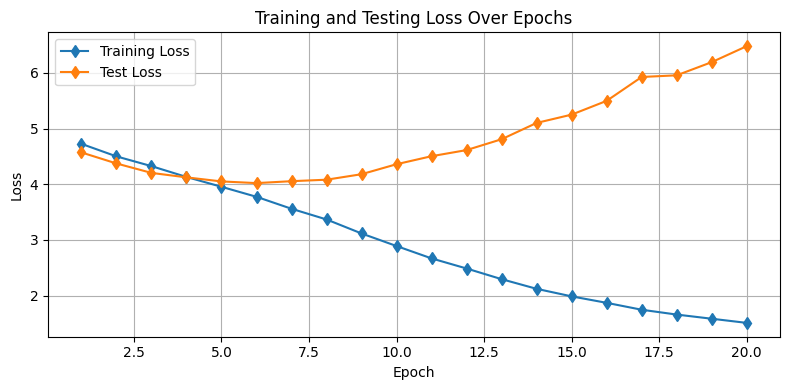

In [27]:
# print test and train loss for scratch CNN
plt.figure(figsize=(8, 4))
plt.plot(range(1, NUM_EPOCHS + 1), train_losses, 'd-', label='Training Loss')
plt.plot(range(1, NUM_EPOCHS + 1), test_losses, 'd-', label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Testing Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

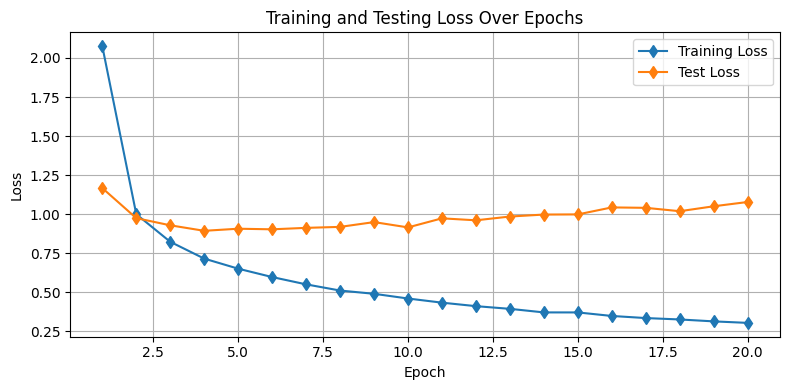

In [28]:
# print test and train loss for ResNet
plt.figure(figsize=(8, 4))
plt.plot(range(1, NUM_EPOCHS + 1), resnet_train_losses, 'd-', label='Training Loss')
plt.plot(range(1, NUM_EPOCHS + 1), resnet_test_losses, 'd-', label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Testing Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

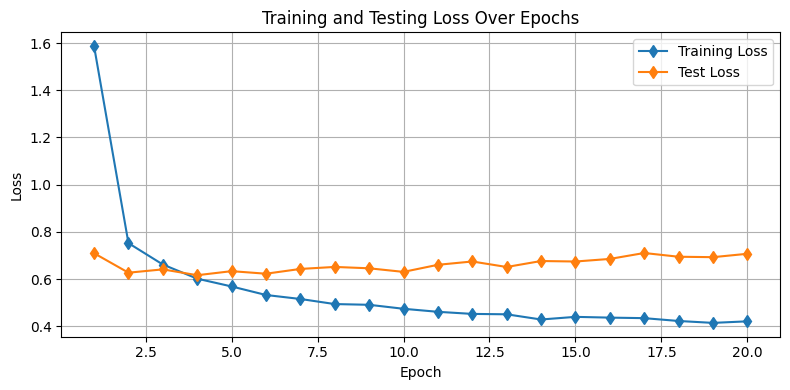

In [29]:
# print test and train loss for scratch Inception
plt.figure(figsize=(8, 4))
plt.plot(range(1, NUM_EPOCHS + 1), inception_train_losses, 'd-', label='Training Loss')
plt.plot(range(1, NUM_EPOCHS + 1), inception_test_losses, 'd-', label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Testing Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [48]:
class_names = test_dataset.dataset.classes

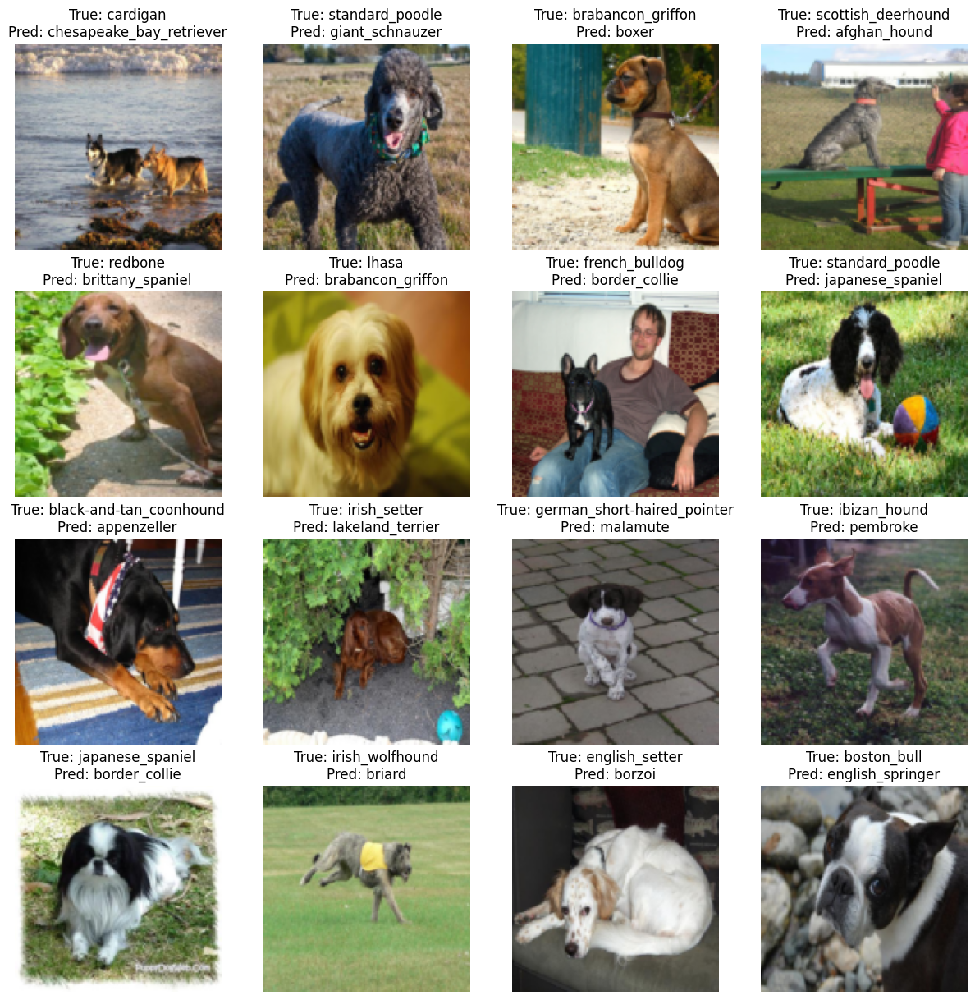

In [49]:
images, labels = next(iter(DataLoader(test_dataset, batch_size=16, shuffle=False)))
images, labels = images.to(device), labels.to(device)

# forward pass through ResNet
outputs = scratchModel(images)

# get predicted class indices
_, preds = torch.max(outputs, dim=1)

# plot images with predicted labels
fig, axes = plt.subplots(4, 4, figsize=(15, 15))
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i].cpu().permute(1,2,0)*0.5 + 0.5)  # unnormalize
    ax.set_title(f"True: {class_names[labels[i]]}\nPred: {class_names[preds[i]]}")
    ax.axis('off')
plt.show()


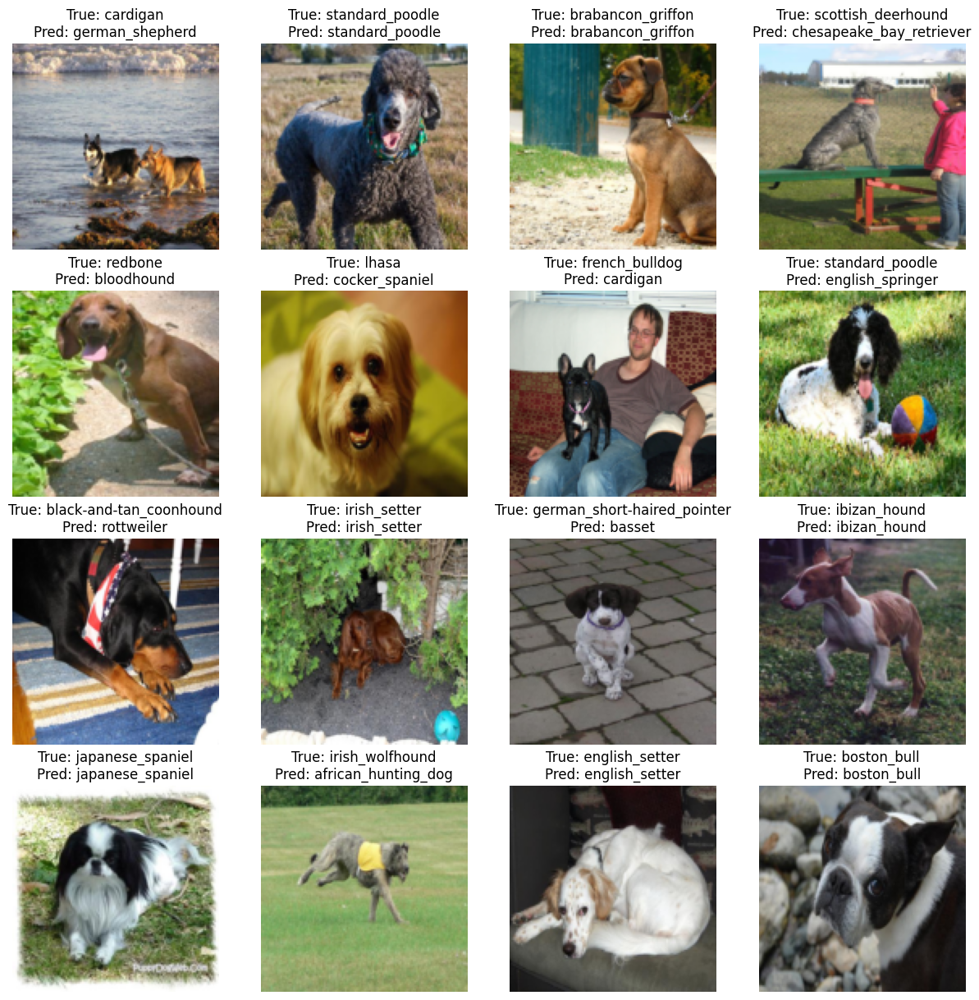

In [50]:
images, labels = next(iter(DataLoader(test_dataset, batch_size=16, shuffle=False)))
images, labels = images.to(device), labels.to(device)

# forward pass through ResNet
outputs = resnetModel(images)

# get predicted class indices
_, preds = torch.max(outputs, dim=1)

# plot images with predicted labels
fig, axes = plt.subplots(4, 4, figsize=(15, 15))
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i].cpu().permute(1,2,0)*0.5 + 0.5)
    ax.set_title(f"True: {class_names[labels[i]]}\nPred: {class_names[preds[i]]}")
    ax.axis('off')
plt.show()


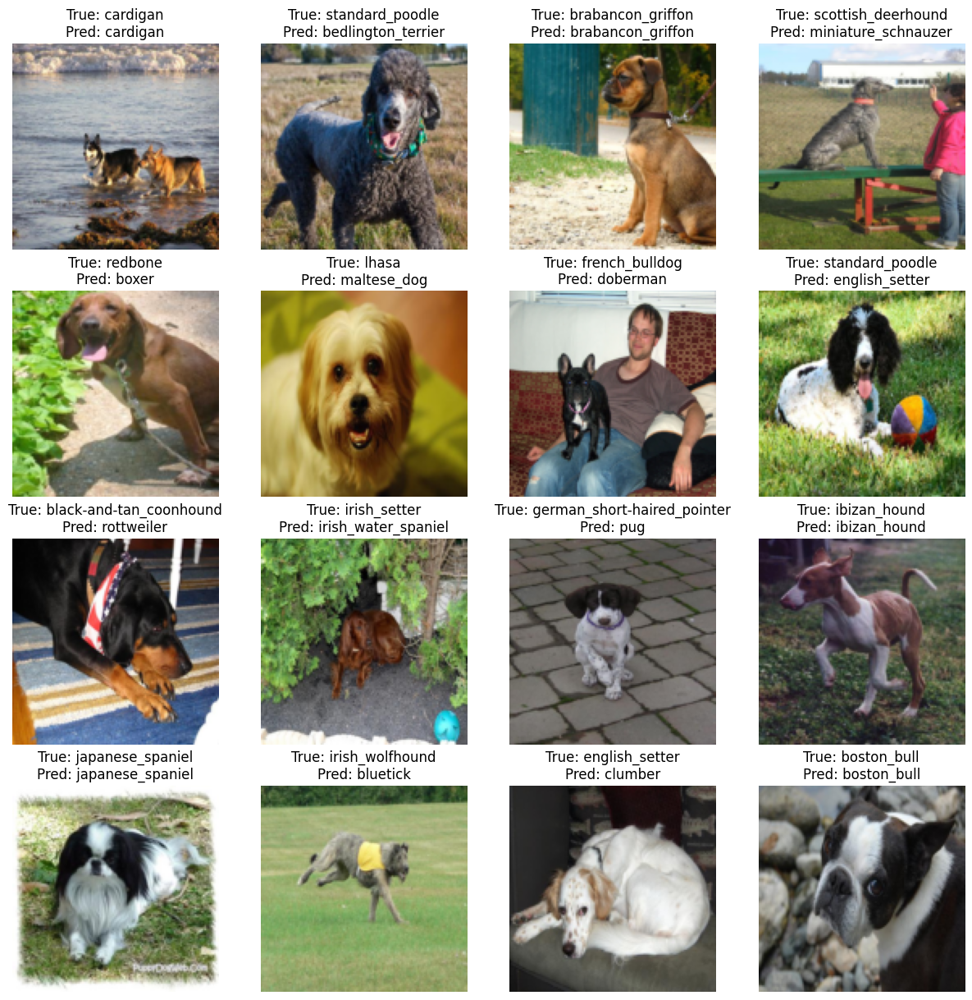

In [51]:
images, labels = next(iter(DataLoader(test_dataset, batch_size=16, shuffle=False)))
images, labels = images.to(device), labels.to(device)

# forward pass
outputs = inceptionModel(images)

# get predicted class index
_, preds = torch.max(outputs, dim=1)

# plot images with predicted label
fig, axes = plt.subplots(4, 4, figsize=(15,15))
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i].cpu().permute(1,2,0)*0.5 + 0.5)
    ax.set_title(f"True: {class_names[labels[i]]}\nPred: {class_names[preds[i]]}")
    ax.axis('off')
plt.show()
